In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"

from matplotlib import rcParams
rcParams["savefig.dpi"] = 100
rcParams["figure.dpi"] = 100

In [2]:
import string

import corner
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import pymc3 as pm
import theano.tensor as tt

from rvhmc.data import RVDataset
from rvhmc.rvhmc import RVModel, RVPlanet
from rvhmc.estimator import lomb_scargle_estimator

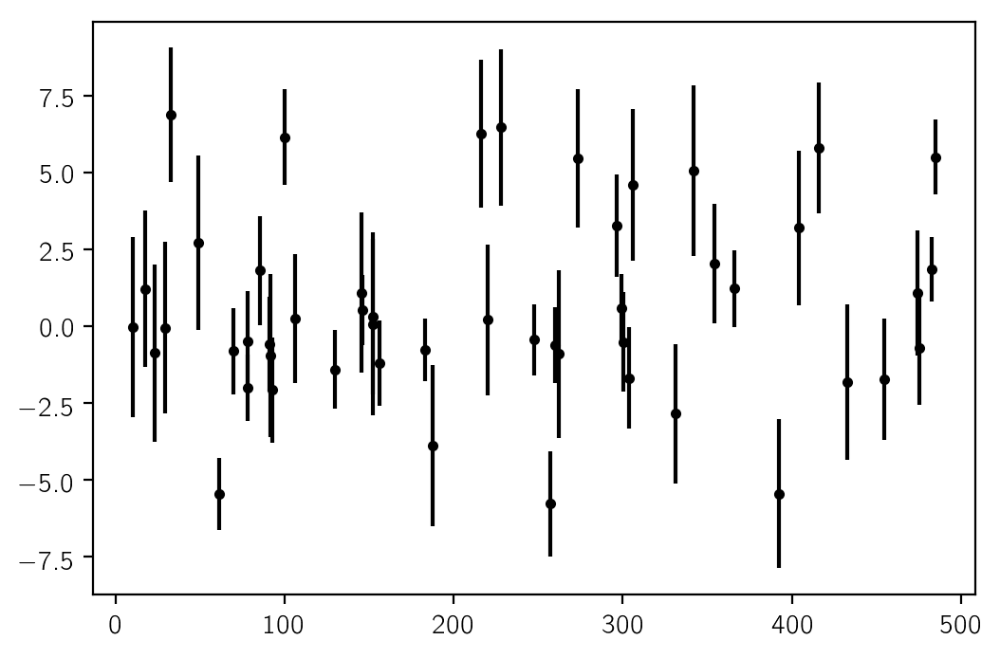

In [3]:
np.random.seed(42)
t = np.sort(np.random.uniform(0, 500, 50))
yerr = np.random.uniform(1, 3, len(t))

P = np.exp(np.random.uniform(np.log(15), np.log(150), 2))
K = np.exp(np.random.uniform(np.log(2), np.log(5), len(P)))
t0 = P * np.random.rand(len(P))

y = K[None, :]*np.sin(2*np.pi*(t[:, None] - t0[None, :])/P[None, :])
y = np.sum(y, axis=1)
y += yerr * np.random.randn(len(t))

plt.errorbar(t, y, yerr=yerr, fmt=".k");

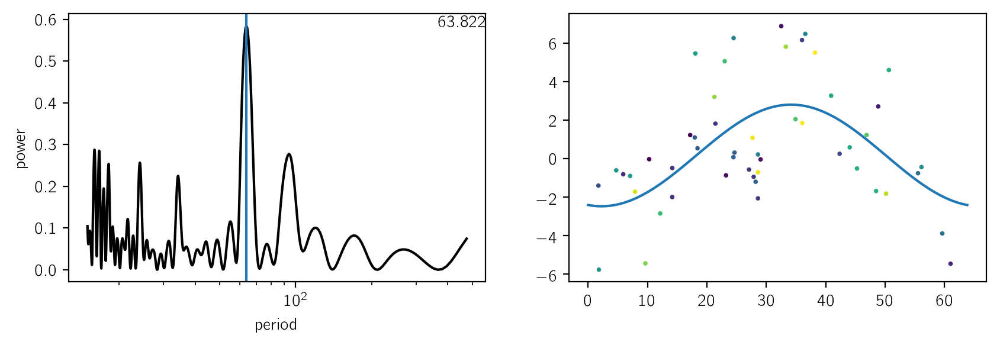

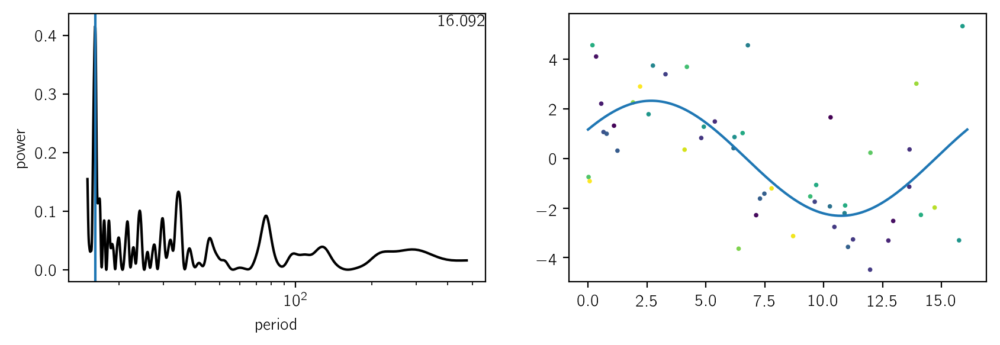

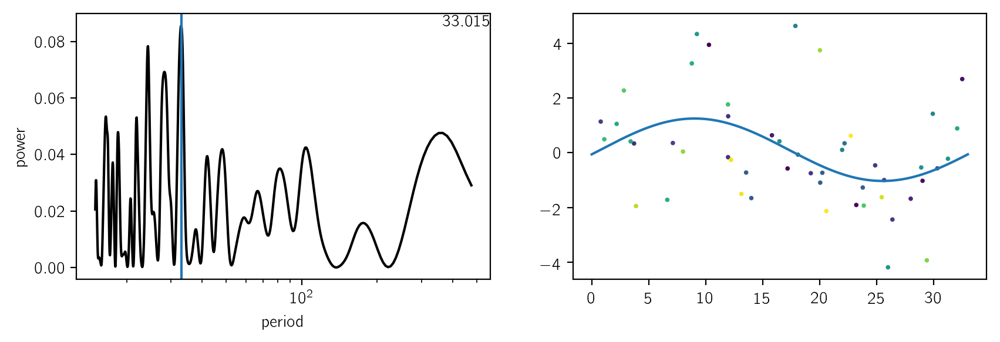

In [4]:
min_period = 15.0
max_period = (t.max() - t.min())
min_amp = 0.01*np.min(yerr)
max_amp = 1.5 * (y.max() - y.min())

y0 = np.array(y)
peaks = []
for i in range(3):
    m = lomb_scargle_estimator(t, y0, yerr, max_period=max_period, min_period=min_period, max_peaks=1, samples_per_peak=20)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
    ax1.semilogx(1.0/m["periodogram"][0], m["periodogram"][1], "k")

    for peak in m["peaks"]:
        ax1.axvline(peak["period"])
    ax1.set_xlabel("period")
    ax1.set_ylabel("power")

    peak = dict(m["peaks"][0])
    A = np.vstack([
        np.sin(2*np.pi*t/peak["period"]),
        np.cos(2*np.pi*t/peak["period"]),
        np.ones_like(t),
    ]).T
    w = np.linalg.solve(np.dot(A.T, A), np.dot(A.T, y0))
    x = np.linspace(0, peak["period"], 500)
    Am = np.vstack([
        np.sin(2*np.pi*x/peak["period"]),
        np.cos(2*np.pi*x/peak["period"]),
        np.ones_like(x),
    ]).T
    model = np.dot(Am, w)
    peak["amp"] = 0.5*(model.max() - model.min())
    peak["phase"] = np.arctan2(w[1], w[0])

    ax2.scatter(t % peak["period"], y0, c=t, s=3)
    ax2.plot(x, model)

    ax1.annotate("{0:.3f}".format(peak["period"]), xy=(1, 1),
                 xycoords="axes fraction", ha="right", va="top")
    
    y0 -= np.dot(A, w)
    
    peaks.append(peak)
peaks = sorted(peaks, key=lambda x: x["amp"])

In [5]:
peaks

[{'amp': 1.1398912527128777,
  'log_power': -2.457991351930275,
  'period': 33.01548809401783,
  'period_uncert': 1.118562142313197,
  'phase': -0.14826036514419885},
 {'amp': 2.3199597058449823,
  'log_power': -0.8762929481986248,
  'period': 16.09150544768165,
  'period_uncert': 0.20915109973604748,
  'phase': 0.5229169379185299},
 {'amp': 2.6404914156314647,
  'log_power': -0.537340435278935,
  'period': 63.82231845778825,
  'period_uncert': 3.5877842068236885,
  'phase': -1.793281542222489}]

In [6]:
with pm.Model() as model:
    data = RVDataset("data", t, y, yerr,
                     meanrv=pm.Normal("meanrv", mu=0.0, sd=100.0),)
#                      logs=pm.Uniform("logs", lower=-5, upper=2))
    
    planets = []
    for peak, name in zip(peaks, string.ascii_lowercase[1:]):
        planets.append(
            RVPlanet(
                name,
                pm.Uniform(name + ":logP", np.log(min_period), np.log(max_period),
                           testval=np.log(peak["period"])),
                pm.Uniform(name + ":logK", np.log(min_amp), np.log(max_amp),
                           testval=np.log(np.clip(peak["amp"], min_amp+1e-2, max_amp-1e-2))),
                eccen=pm.Beta(name + ":eccen", alpha=0.867, beta=3.03, testval=0.1),
            ))
        if len(planets) > 1:
            pm.Potential("order:{0}".format(name),
                         tt.switch((planets[-2].logK < planets[-1].logK),
                                   0.0, -np.inf))
    
    RVModel("rv", data, planets)
    pm.Deterministic("logp", model.logpt)
    
    def find_MAP(res, vars=None):
        new_res = pm.find_MAP(res, vars=vars)
        if res is None or new_res["logp"] > res["logp"]:
            res = new_res
            new_res = pm.find_MAP(res, vars=vars)
            if new_res["logp"] > res["logp"]:
                return new_res
        return res
    
    res = None
    res = find_MAP(res, [p.phivec for p in planets])
    vars = [v for p in planets for v in p.vars if v is not p.logP]
    res = find_MAP(res, vars)
    res = find_MAP(res, [v for p in planets for v in (p.logP, p.logK)])
    res = find_MAP(res, [v for p in planets for v in p.vars])
    res = find_MAP(res)
    print(res)
    
    trace = pm.sample(2000, tune=2000, start=res)

logp = -108.69, ||grad|| = 0.0028403: 100%|██████████| 15/15 [00:00<00:00, 1449.14it/s]
logp = -108.69, ||grad|| = 1.3637e-05: 100%|██████████| 4/4 [00:00<00:00, 1663.09it/s]
logp = 64.676, ||grad|| = 2.6863: 100%|██████████| 48/48 [00:00<00:00, 1204.79it/s]
logp = -107.66, ||grad|| = 0.13923: 100%|██████████| 34/34 [00:00<00:00, 1821.61it/s]
logp = -107.66, ||grad|| = 0.0073068: 100%|██████████| 5/5 [00:00<00:00, 1696.18it/s]
logp = -104.63, ||grad|| = 51.947: 100%|██████████| 60/60 [00:00<00:00, 1253.68it/s]
logp = -104.58, ||grad|| = 235.99: 100%|██████████| 78/78 [00:00<00:00, 1243.62it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


{'meanrv': array(0.), 'b:logP_interval__': array(-1.21938786), 'b:logK_interval__': array(0.55930426), 'b:eccen_logodds__': array(-2.19722458), 'b:phivec_unitvector__': array([-0.07152931,  6.23156118]), 'b:omegavec_unitvector__': array([1., 0.]), 'c:logP_interval__': array(-3.8694961), 'c:logK_interval__': array(0.99944353), 'c:eccen_logodds__': array(-2.19722458), 'c:phivec_unitvector__': array([ 5.53204632, 15.60145698]), 'c:omegavec_unitvector__': array([1., 0.]), 'd:logP_interval__': array(-0.3239652), 'd:logK_interval__': array(1.1529154), 'd:eccen_logodds__': array(-2.19722458), 'd:phivec_unitvector__': array([-12.08463615,  -4.18344806]), 'd:omegavec_unitvector__': array([1., 0.]), 'b:logP': array(3.49584123), 'b:logK': array(0.20218646), 'b:eccen': array(0.1), 'b:phivec': array([-0.0114778 ,  0.99993413]), 'b:phi': array(1.58227438), 'b:omegavec': array([1., 0.]), 'b:omega': array(0.), 'b:t0': array(8.30474844), 'c:logP': array(2.77866915), 'c:logK': array(0.91571661), 'c:ecce

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [d:omegavec, d:phivec, d:eccen, d:logK, d:logP, c:omegavec, c:phivec, c:eccen, c:logK, c:logP, b:omegavec, b:phivec, b:eccen, b:logK, b:logP, meanrv]
Sampling 2 chains: 100%|██████████| 8000/8000 [05:39<00:00, 12.15draws/s]
There were 526 divergences after tuning. Increase `target_accept` or reparameterize.
There were 569 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.7188967014017933, but should be close to 0.8. Try to increase the number of tuning steps.
The estimated number of effective samples is smaller than 200 for some parameters.


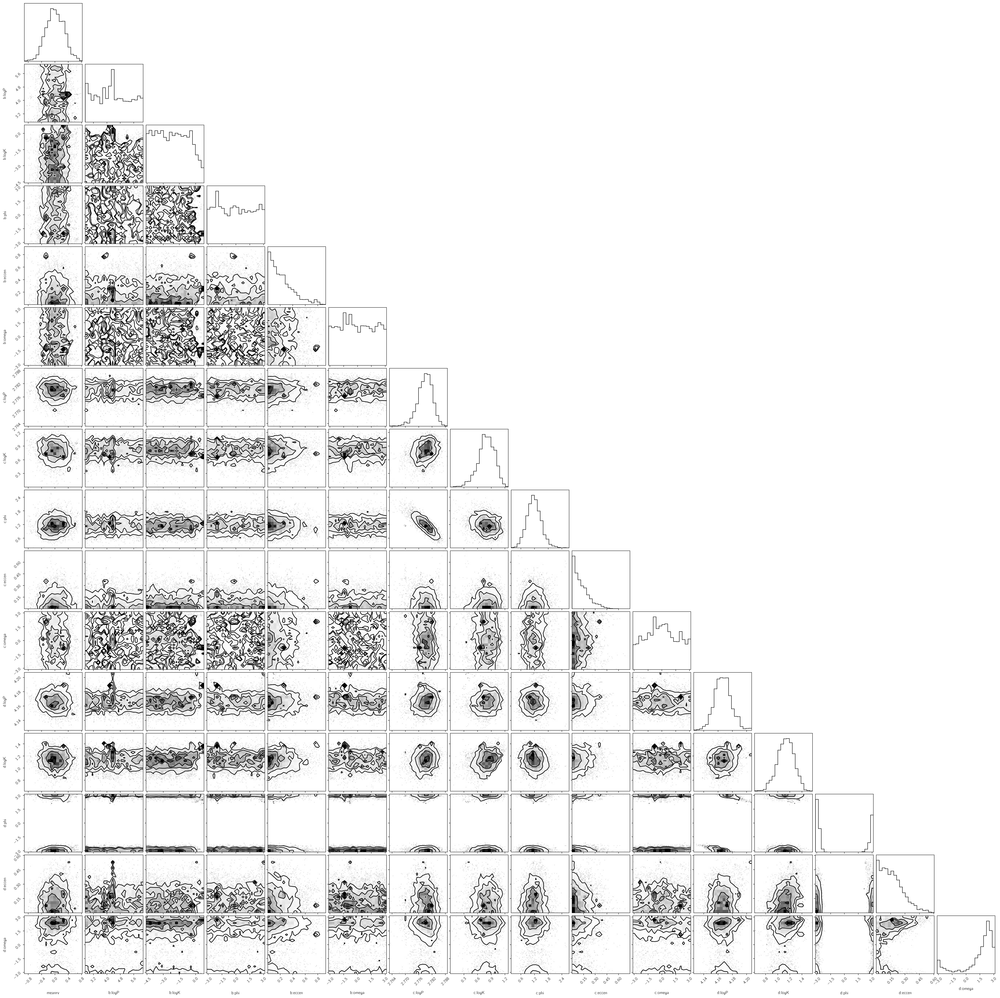

In [7]:
labels = ["meanrv"] + [p.name + k for p in planets for k in (":logP", ":logK", ":phi", ":eccen", ":omega")]
samples = np.vstack([trace[k] for k in labels]).T
corner.corner(samples, labels=labels);

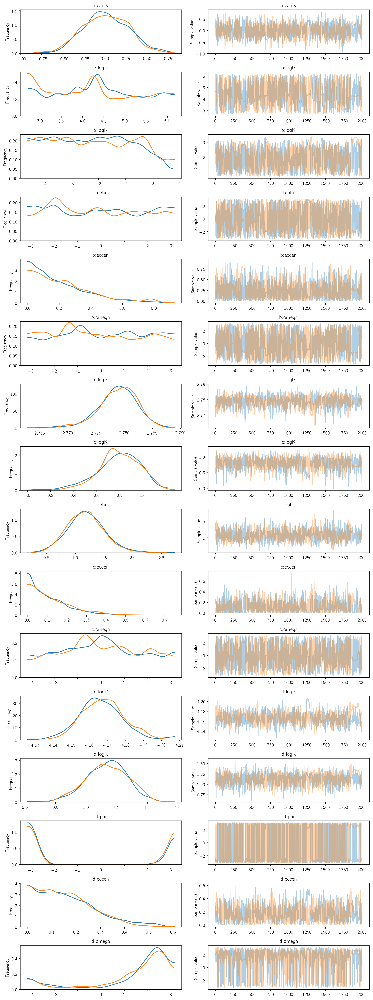

In [8]:
pm.traceplot(trace, varnames=labels);

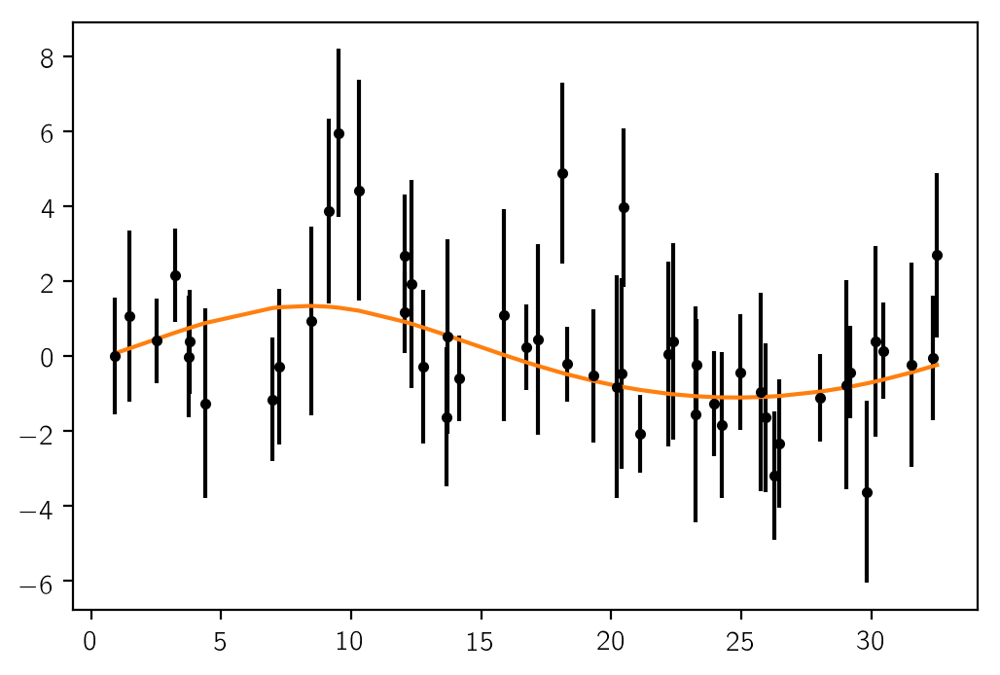

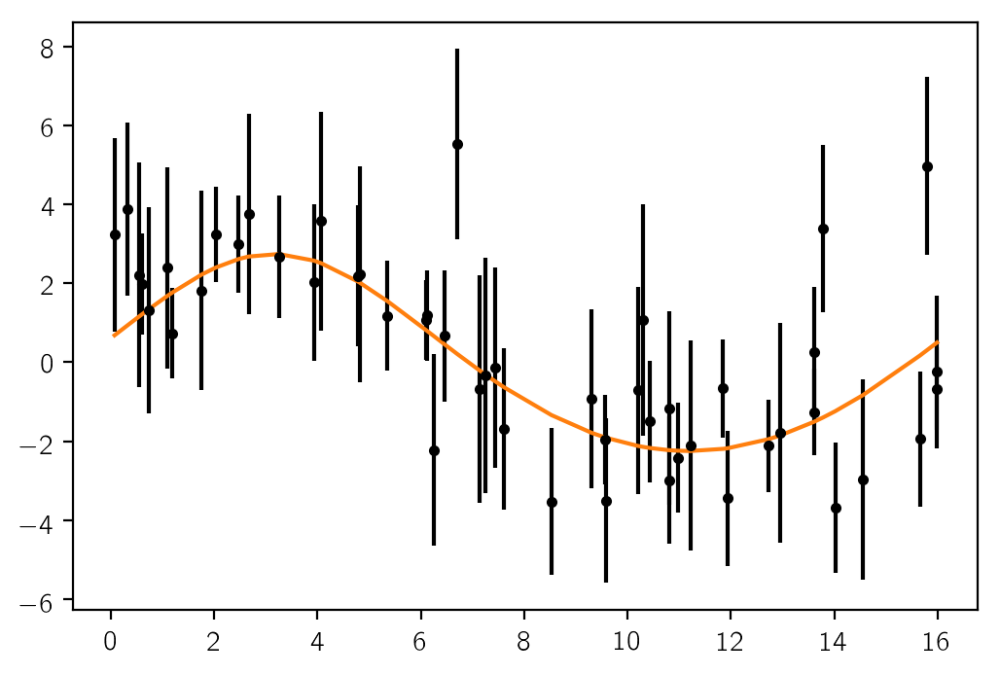

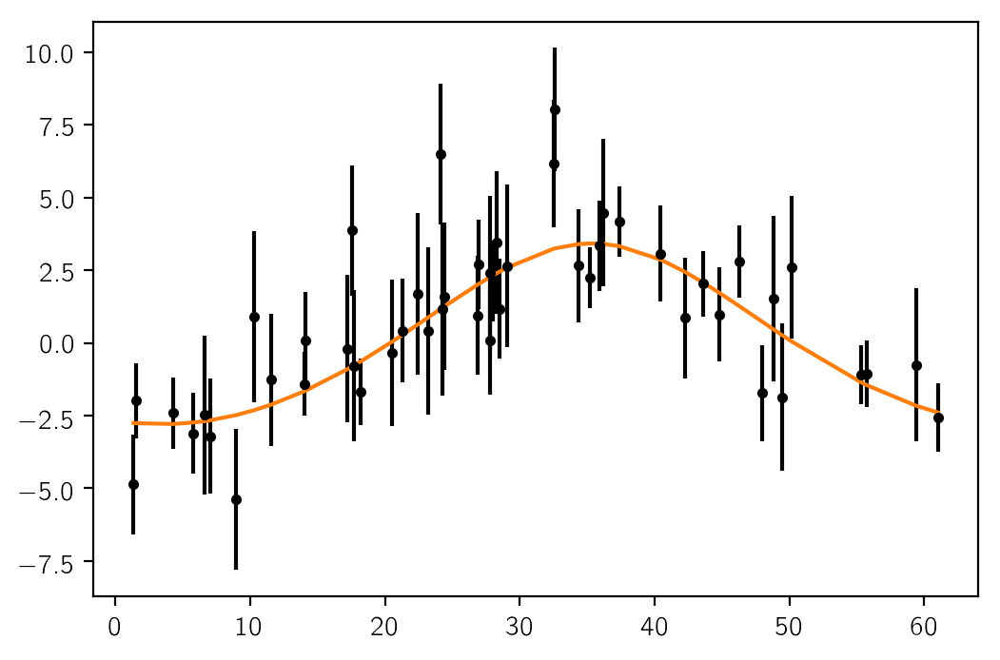

In [9]:
mods = res["rv:data:rvmodels"]
resid = y - res["rv:data:model"]

for i, planet in enumerate(planets):
    plt.figure()
    period = np.exp(res[planet.logP.name])
    plt.errorbar(t % period, resid + mods[:, i], yerr=yerr, fmt=".k")
    x = t % period
    inds = np.argsort(x)
    plt.plot(x[inds], res["rv:data:rvmodels"][:, i][inds], color="C1")